Advanced Lane Finding Using Computer Vision Techniques
----------------------------------------------------------

### Key Steps
1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images
1. Apply a distortion correction to raw images.
2. Use color transforms, gradients, etc., to create a thresholded binary image.
3. Apply a perspective transform to rectify binary image ("birds-eye view").
4. Detect lane pixels and fit to find the lane boundary.
5. Determine the curvature of the lane and vehicle position with respect to center.
6. Warp the detected lane boundaries back onto the original image.
7. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [12]:
# Import Libraries
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import os
import pickle
%matplotlib qt
%matplotlib inline

### 1. Camera Calibration

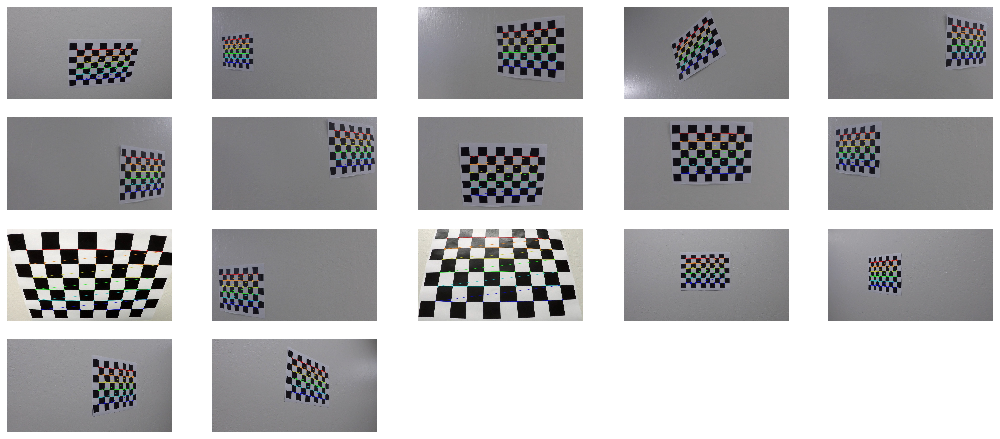

In [13]:

# Object points - 6X9 grid, x,y,z coordinates
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
flag = True
corners_detected = []
corners_undetected = []
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    dst = np.copy(img)
    # Find chessboard corners, no thresholding
    ret, corners = cv2.findChessboardCorners(img, (9,6), None)

    # If found, add object points, image points
    if ret:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(dst, (9,6), corners, ret)
        write_name = 'camera_cal/corners_found/'+os.path.splitext(os.path.basename(fname))[0]+'_corners_found'+'.jpg'
        corners_detected.append(write_name)
        cv2.imwrite(write_name, dst)
    else:
        corners_undetected.append(fname)
        
        

plt.figure(figsize=(18, 10))
#plt.suptitle("Corner detection", size=24)
for i, image in enumerate(corners_detected):
    img = cv2.imread(image)
    plt.subplot2grid((5,5), (i//5, i%5), colspan=1, rowspan=1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')

### 2. Distortion Correction

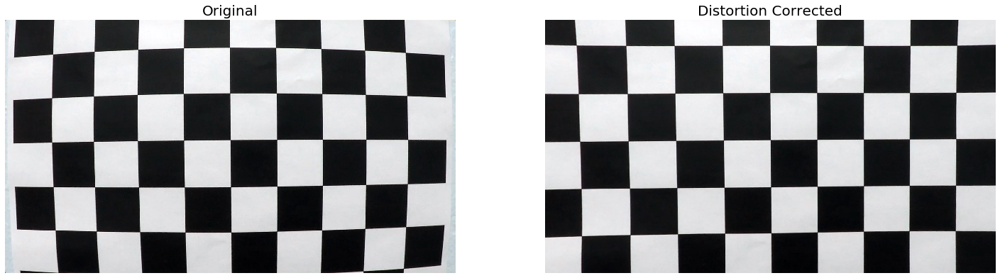

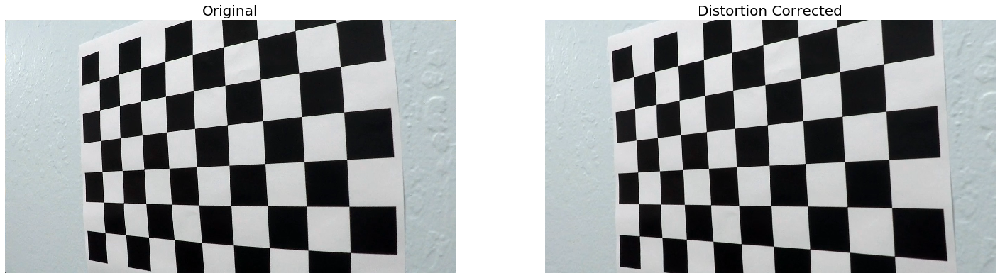

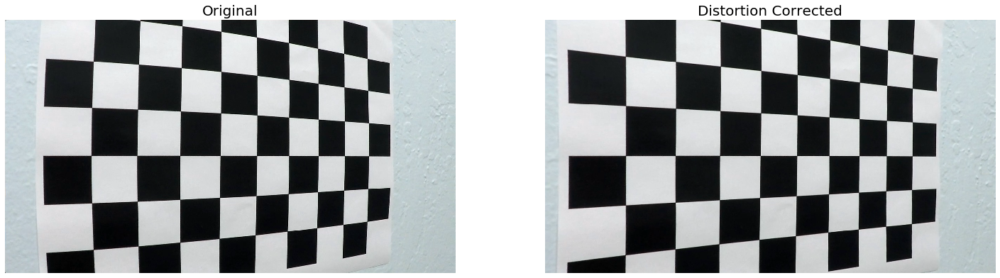

In [14]:
def distortion_corr(img):
    img_size = (img.shape[1], img.shape[0])
    # Perform camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    #cv2.imwrite('camera_cal/distortion_test_undistorted.jpg', dst)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump( dist_pickle, open( "camera_cal/dist_pickle.p", "wb" ) )
    
    return dst

def distortion_corr_final(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)


for i, image in enumerate(corners_undetected):
    f, (x1, x2) = plt.subplots(1, 2, figsize=(25, 10))
    x1.axis('off')
    img = cv2.imread(image)
    x1.imshow(img)
    x1.set_title('Original', fontsize=20)
    x2.axis('off')
    x2.imshow(distortion_corr(img))
    x2.set_title('Distortion Corrected', fontsize=20) 

### 3a. Color Thresholding

In [15]:
def color_threshold(img):
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    s_channel = hls[:,:,2]
    s_thresh_min = 170
    s_thresh_max = 255
    color_binary = np.zeros_like(s_channel)
    color_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    return color_binary

### 3b. Gradient Thresholding

In [16]:
def grad_threshold(img):
    sobel_kernel = 9
    thresh_min = 25
    thresh_max = 100
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = 0
    abs_sobel = np.sqrt(sobelx**2 + sobely**2)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    grad_mag_binary = np.zeros_like(scaled_sobel)
    grad_mag_binary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return sxbinary

### 3c. Combined Thresholding

In [17]:
def combined_threshold(img):
    color_binary = color_threshold(img)
    grad_binary = grad_threshold(img)
    combined_binary = np.zeros_like(color_binary)
    combined_binary[(grad_binary == 1) | (color_binary == 1)] = 1
    stack_color = np.dstack(( np.zeros_like(color_binary), color_binary, grad_binary)) * 255
    return stack_color, combined_binary

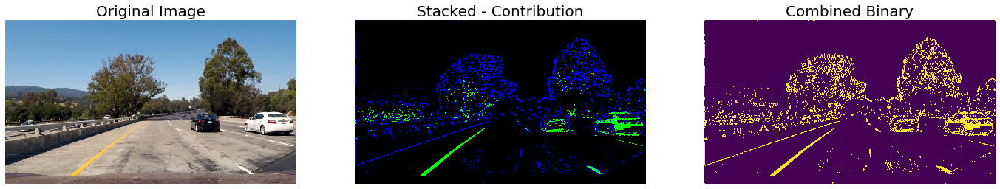

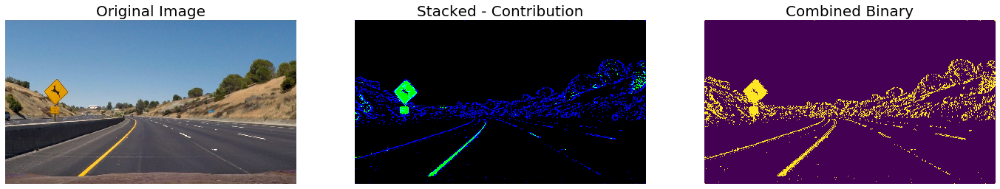

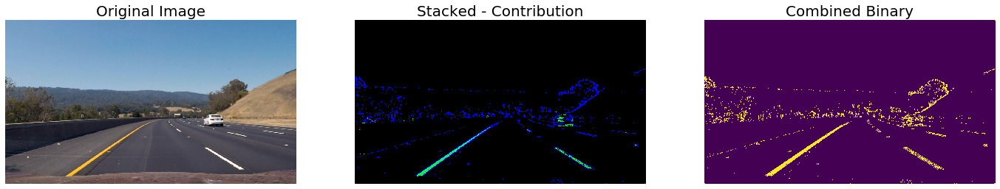

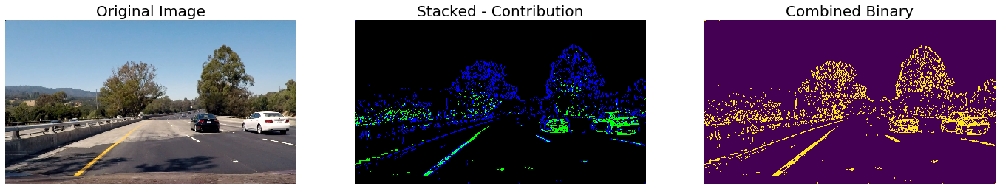

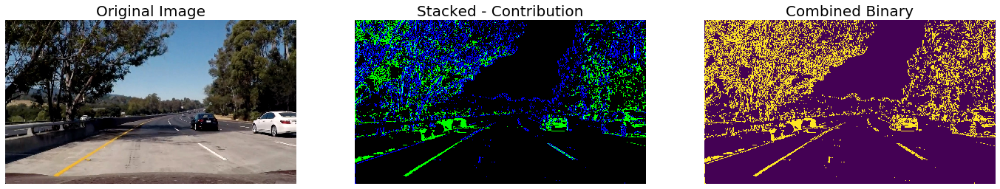

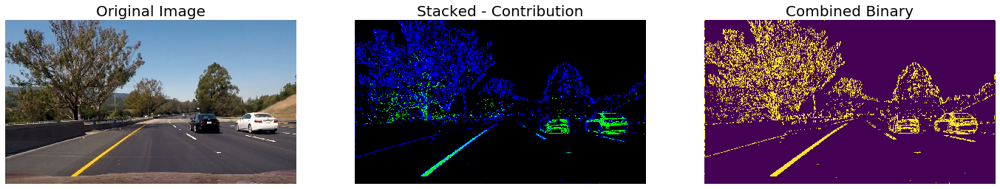

In [18]:
for file in glob.glob('test_images/test*.jpg'):
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    stack_color, combined_binary =  combined_threshold(img)
    f, (x1, x2, x3) = plt.subplots(1, 3, figsize=(24, 9))
    x1.axis('off')
    x1.imshow(img)
    x1.set_title('Original Image', fontsize=20)

    x2.axis('off')
    x2.imshow(stack_color)
    x2.set_title('Stacked - Contribution', fontsize=20)
    
    x3.axis('off')
    x3.imshow(combined_binary)
    x3.set_title('Combined Binary', fontsize=20)

### Perspective Transform

In [19]:
def perspective_transform(image):
    ht = image.shape[0]
    wt = image.shape[1]
    
    # source points
    src1 = [wt // 2 - 70, ht * 0.625]
    src2 = [wt // 2 + 70, ht * 0.625]
    src3 = [-100, ht]
    src4 = [wt + 100, ht]
    src = np.float32([src1, src2, src3, src4])
    poly = np.array((src1, src2, src4, src3), np.int32) 
    #cv2.polylines(image, [poly], True, (0,0, 255), 5)
    
    # destination points
    dst1 = [100, 0]
    dst2 = [wt - 100, 0]
    dst3 = [100, ht]
    dst4 = [wt - 100, ht]
    dst = np.float32([dst1, dst2, dst3, dst4])
    
    # perspective transform matrix and warping
    M = cv2.getPerspectiveTransform(src, dst)
    inverse = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(image, M, (wt, ht))
    return warped, inverse

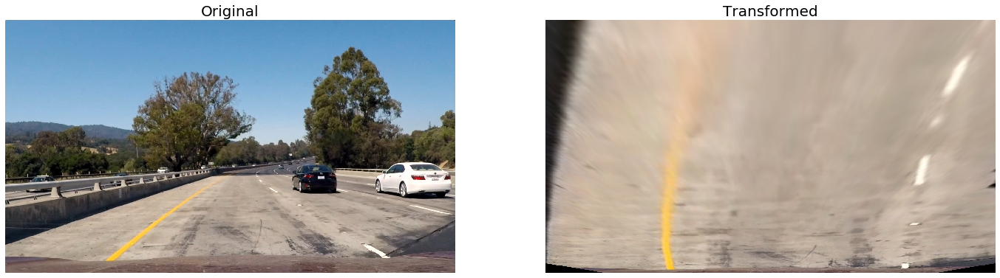

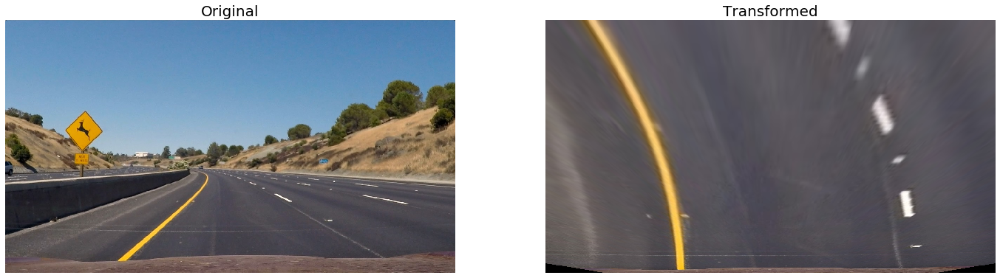

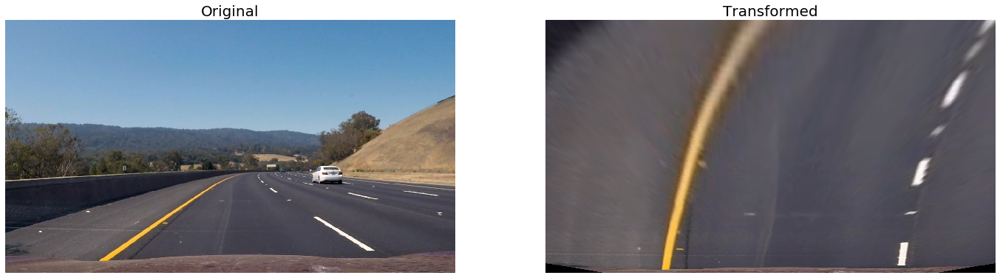

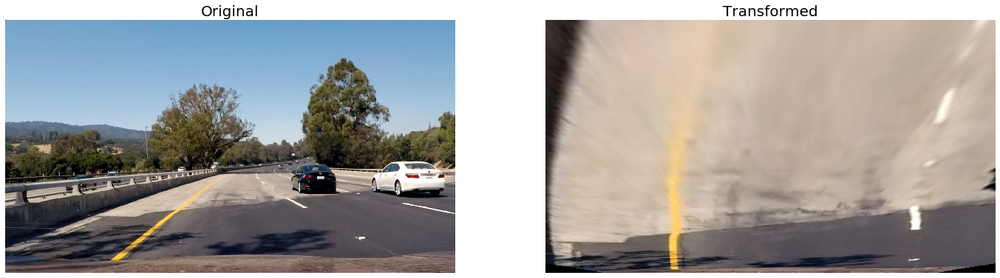

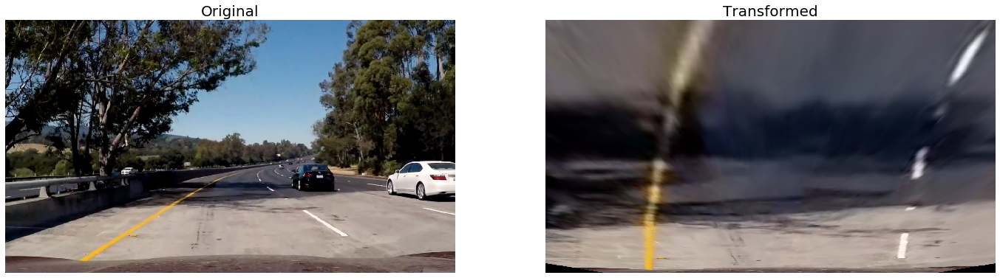

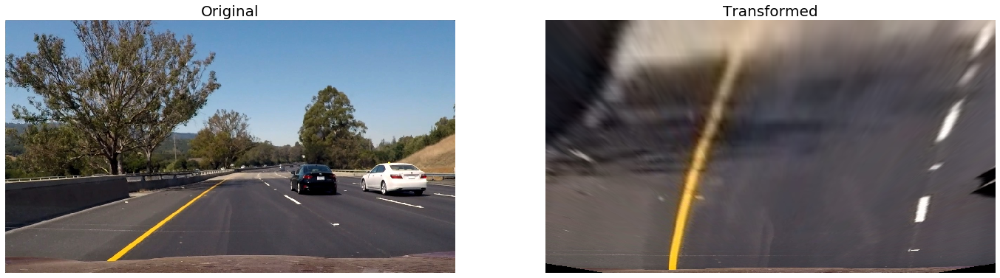

In [20]:
for image in glob.glob('test_images/test*.jpg'):
    image = cv2.imread(image)
    transformed, _ = perspective_transform(image) 
    
    f , (x1, x2) = plt.subplots(1, 2, figsize=(24, 9))
    x1.axis('off')
    x1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    x1.set_title('Original', fontsize=20)

    x2.axis('off')
    x2.imshow(cv2.cvtColor(transformed, cv2.COLOR_BGR2RGB))
    x2.set_title('Transformed', fontsize=20)

### 5. Detect lane pixels and fit a polynomial

In [21]:
def lane_detect(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    h, w = binary_warped.shape
    bottom_half = binary_warped[h//2:,:]
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[100:midpoint]) + 100
    rightx_base = np.argmax(histogram[midpoint:-100]) + midpoint
    
    # HYPERPARAMETERS for sliding window
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height

        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low), (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low), (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        # nonzero()[0] because we want the first dimension. Second dimension is empty
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
    
    ret = {}
    ret['leftx'] = leftx
    ret['lefty'] = lefty
    ret['rightx'] = rightx
    ret['righty'] = righty
    ret['left_fit'] = left_fit
    ret['right_fit'] = right_fit

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    draw_points_left = (np.asarray([left_fitx, ploty]).T).astype(np.int32)   # needs to be int32 and transposed
    draw_points_right = (np.asarray([right_fitx, ploty]).T).astype(np.int32)   # needs to be int32 and transposed
    cv2.polylines(out_img, [draw_points_left], False, (255,204,0),10)  # args: image, points, closed, color
    cv2.polylines(out_img, [draw_points_right], False, (255,204,0),10)  # args: image, points, closed, color

    return out_img, ret

### Calculating curvature and offset

In [22]:
def curvature_offset(ret, lane_fit):
    y_eval = lane_fit.shape[0]-1  # 720p video/image, so last (lowest on screen) y index is 719
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Extract left and right line pixel positions
    leftx = ret['leftx']
    lefty = ret['lefty']
    rightx = ret['rightx']
    righty = ret['righty']
    left_fit = ret['left_fit']
    right_fit = ret['right_fit']
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature in meters
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    avg_curverad = (left_curverad + right_curverad)/2
    
    # Calculate vehicle center offset in pixels
    # Calculate X coordinates of the lanes at the bottom of the image using the fit coeffs
    bottom_y = (lane_fit.shape[0] - 1)
    bottom_x_left = left_fit[0]*(bottom_y**2) + left_fit[1]*bottom_y + left_fit[2]
    bottom_x_right = right_fit[0]*(bottom_y**2) + right_fit[1]*bottom_y + right_fit[2]
    vehicle_offset = np.absolute(lane_fit.shape[1]/2 - (bottom_x_left + bottom_x_right)/2)

    # Convert pixel offset to meters
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    vehicle_offset *= xm_per_pix
    
    return avg_curverad, vehicle_offset

### Visualization - Overlays

In [23]:
def visualize(corrected, stacked, lane_fit, ret, curvature, offset, inverse):
    
    left_fit = ret['left_fit']
    right_fit = ret['right_fit']
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, corrected.shape[0]-1, corrected.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw the lines on
    #warp_zero = np.zeros_like(warped).astype(np.uint8)
    #color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    color_warp = np.zeros((corrected.shape[0], corrected.shape[1], corrected.shape[2]), dtype='uint8')  # NOTE: Hard-coded image dimensions

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, inverse, (corrected.shape[1], corrected.shape[0]))
    # Combine the result with the original image
    result = cv2.addWeighted(corrected, 1, newwarp, 0.3, 0)
    
    # draw rectangle for overlays
#     shapes = np.zeros_like(img, np.uint8)
#     cv2.rectangle(shapes,(0,0), (result.shape[1],300),(2,2,2), cv2.FILLED)
#     mask = shapes.astype(bool)
#     alpha = 1
#     result[mask] = cv2.addWeighted(img, 1, shapes, alpha, 0)[mask]
    result[:300, :, :] = result[:300, :, :] * 0.4

    # picture in picture
    stacked_overlay = cv2.resize(stacked, (0,0), fx=0.3, fy=0.3)
    lane_fit_overlay = cv2.resize(lane_fit, (0,0), fx=0.3, fy=0.3)
    overlay_ht, overlay_wt, _ = stacked_overlay.shape
    result[30:30+overlay_ht, 30:30+overlay_wt, :] = lane_fit_overlay
    result[30:30+overlay_ht, 60+overlay_wt:60+2*overlay_wt, :] = stacked_overlay
    
    # Annotate lane curvature values and vehicle offset from center
    label_str = f'Radius of curvature: {round(curvature,2)} m'
    result = cv2.putText(result, label_str, (80+2*overlay_wt,50), cv2.FONT_HERSHEY_DUPLEX, 0.9, (255, 255, 255), 2)

    label_str = f'Vehicle offset: {round(offset,2)} m'
    result = cv2.putText(result, label_str, (80+2*overlay_wt,90), cv2.FONT_HERSHEY_DUPLEX, 0.9, (255, 255, 255), 2)
    

    return result

### Pipeline - lane detection

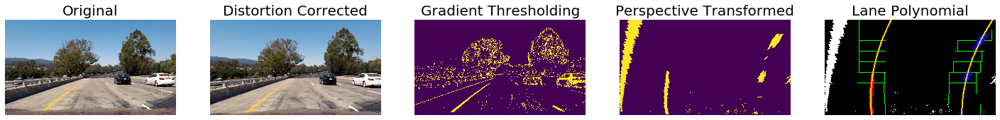

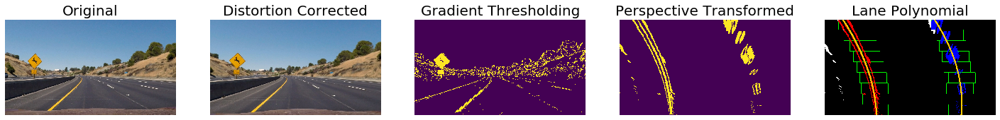

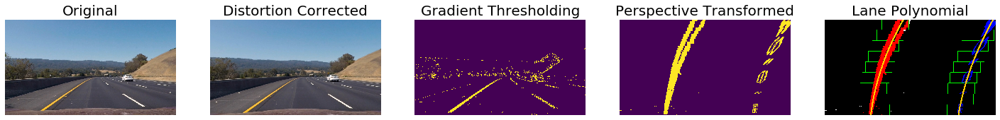

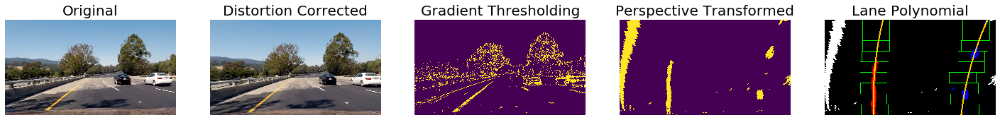

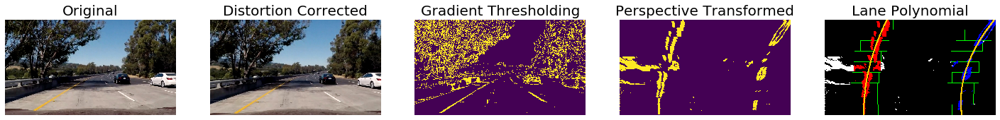

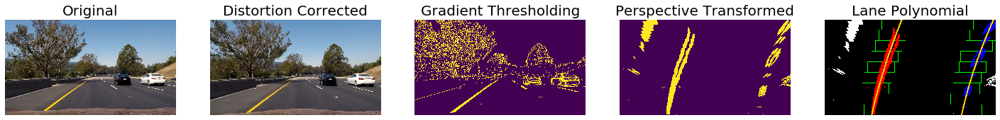

In [24]:
pk = pickle.load(open( "camera_cal/dist_pickle.p", "rb" ))
mtx = pk['mtx']
dist = pk['dist']

for image_file in glob.glob('test_images/test*.jpg'):
    img = cv2.imread(image_file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    corrected = cv2.undistort(img, mtx, dist, None, mtx)
    stacked , binary = combined_threshold(corrected)
    transformed, inverse = perspective_transform(binary)
    lane_fit, ret = lane_detect(transformed)
    curvature, offset = curvature_offset(ret, lane_fit)
    #print(curvature)
    f, (x1, x2, x3, x4, x5) = plt.subplots(1, 5, figsize=(25, 10))
    x1.axis('off')
    x1.imshow(img)
    x1.set_title('Original', fontsize=20)
    x2.axis('off')
    x2.imshow(corrected)
    x2.set_title('Distortion Corrected', fontsize=20) 
    x3.axis('off')
    x3.imshow(binary)
    x3.set_title('Gradient Thresholding', fontsize=20) 
    x4.axis('off')
    x4.imshow(transformed)
    x4.set_title('Perspective Transformed', fontsize=20) 
    x5.axis('off')
    x5.imshow(lane_fit)
    x5.set_title('Lane Polynomial', fontsize=20)     

### Pipeline - final

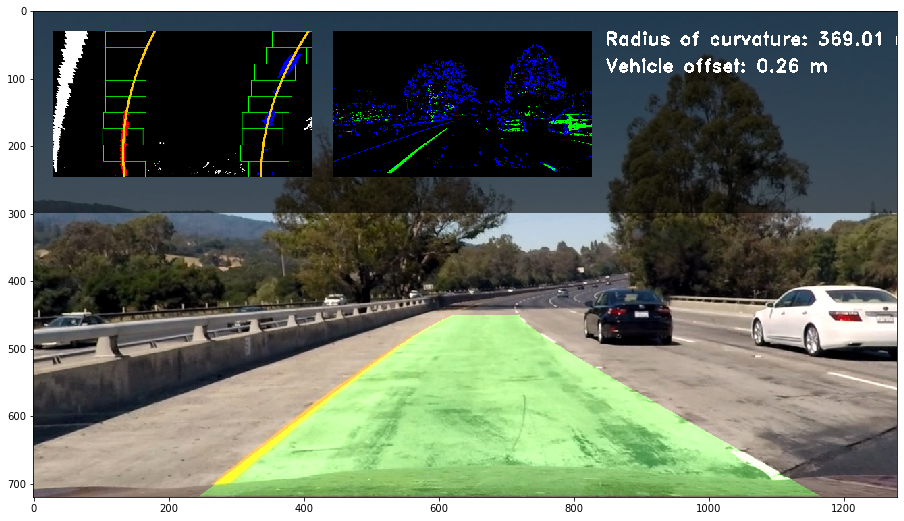

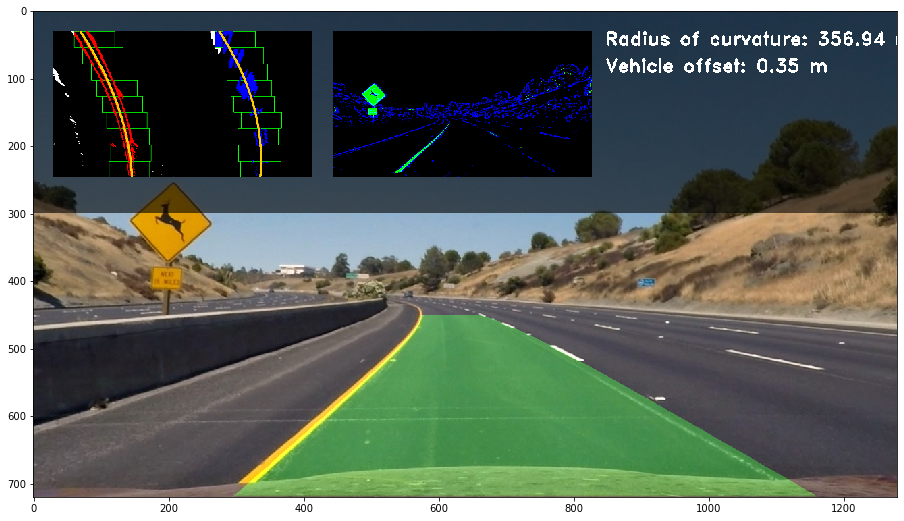

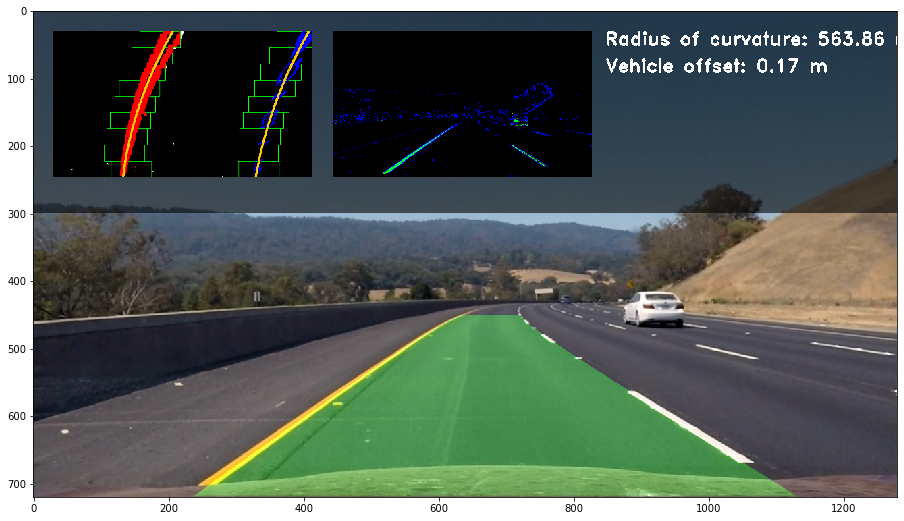

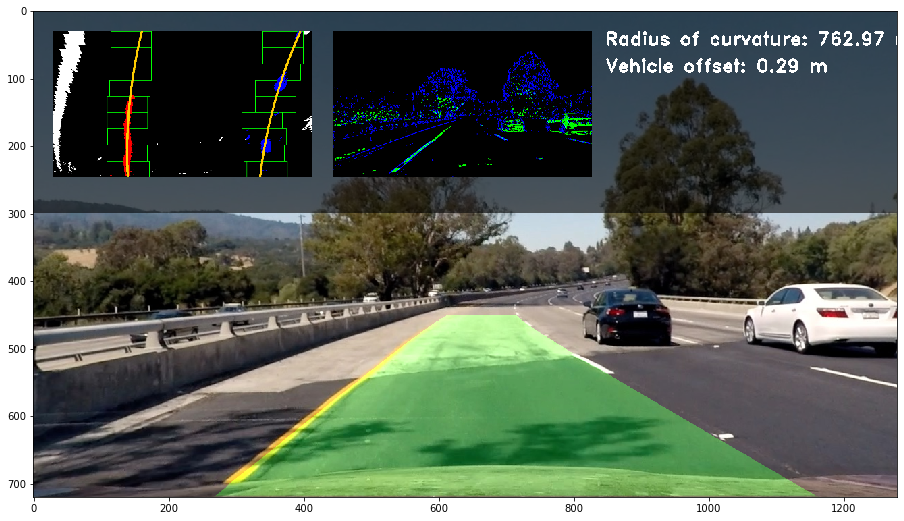

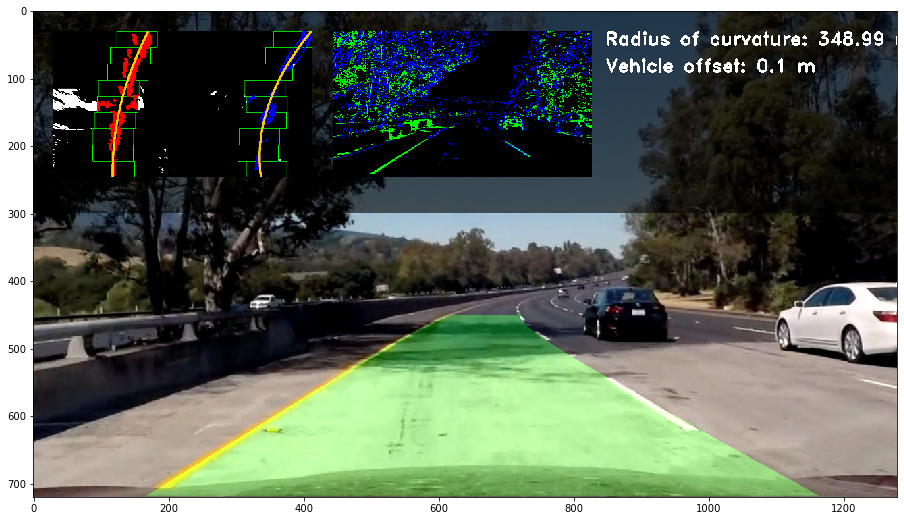

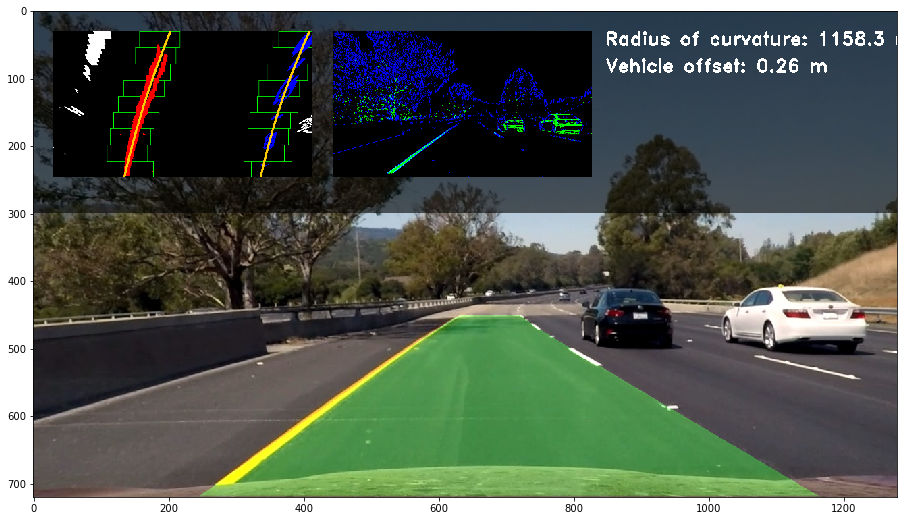

In [25]:
pk = pickle.load(open( "camera_cal/dist_pickle.p", "rb" ))
mtx = pk['mtx']
dist = pk['dist']

for image_file in glob.glob('test_images/test*.jpg'):
    img = cv2.imread(image_file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    corrected = cv2.undistort(img, mtx, dist, None, mtx)
    stacked , binary = combined_threshold(corrected)
    transformed, inverse = perspective_transform(binary)
    lane_fit, ret = lane_detect(transformed)
    curvature, offset = curvature_offset(ret, lane_fit)
    final = visualize(corrected, stacked, lane_fit, ret, curvature, offset, inverse)
    plt.imsave(image_file.replace('test_images', 'output_images'), final)
    plt.figure(figsize=(12, 12))
    plt.subplots_adjust(left=0.0, right=1, top=1, bottom=0)
    plt.imshow(final)

### Video processing

In [26]:
def video_pipeline(img):
    #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    corrected = distortion_corr_final(img, mtx, dist)
    stacked, binary = combined_threshold(corrected)
    transformed, inverse = perspective_transform(binary)
    lane_fit, ret = lane_detect(transformed)
    curvature, offset = curvature_offset(ret, lane_fit)
    final = visualize(corrected, stacked, lane_fit, ret, curvature, offset, inverse)
    return final

In [27]:
from moviepy.editor import VideoFileClip
def annotate_video(input_file, output_file):
    """ Given input_file video, save annotated video to output_file """
    video = VideoFileClip(input_file)
    annotated_video = video.fl_image(video_pipeline)
    annotated_video.write_videofile(output_file, audio=False)
annotate_video('project_video.mp4', 'out4.mp4')

Moviepy - Building video out4.mp4.
Moviepy - Writing video out4.mp4



Moviepy - Done !
Moviepy - video ready out4.mp4
